<a href="https://colab.research.google.com/github/steven-tey/CS110/blob/master/CS156_LBA_ML.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## **Importing all necessary libraries**

In [0]:
!pip install python-resize-image

In [0]:
import os
from PIL import Image
from resizeimage import resizeimage
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import minmax_scale
from sklearn.decomposition import PCA

## **Loading and processing all photos**

In [0]:
# load all images into images folder
images = os.listdir('/pictures')

images_flattened = []
# for each image path
for path in images:
    # open it as a read file in binary mode
    with open('/pictures/'+path, 'r+b') as f:
        # open it as an image
        with Image.open(f) as image:
            # resize the image to be more manageable
            cover = resizeimage.resize_cover(image, [512, 512])
            # flatten the matrix to an array and append it to 
            # all flattened images
            images_flattened.append((np.array(cover).flatten()))

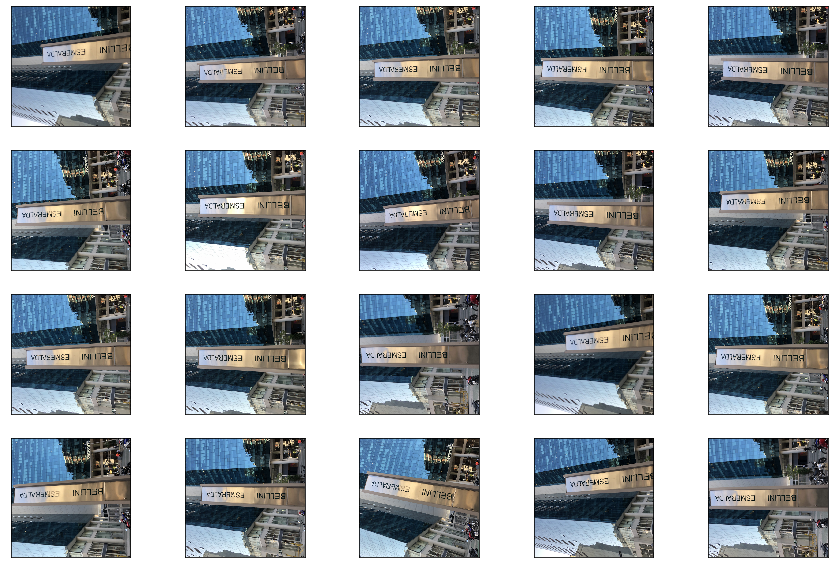

In [0]:
# defining figure size and axes for subplots
fig, axes = plt.subplots(4,5,figsize=(12,8))

# bundling all 20 images into a 4 by 5 plot
for i,ax in enumerate(axes.flatten()):
    ax.imshow(images_flattened[i].reshape(512,512,3))
    ax.set_xticks([])
    ax.set_yticks([])

# adjusting the margins and paddings and showing the plot
plt.tight_layout()
plt.subplots_adjust(hspace=0.2, wspace=0.2)
plt.show()

## **Principle Component Analysis (PCA)**

In [0]:
# conducting PCA with 2 principle components
pca = PCA(n_components=2)

# fitting the PCA to the flattened images
principalComponents = pca.fit(images_flattened)

# transforming the images from 512x512 to just 2D
transformed_images = pca.transform(images_flattened)

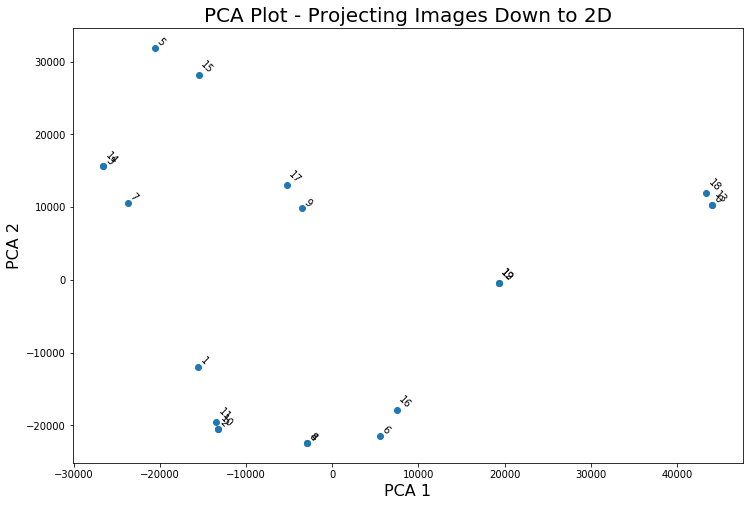

In [0]:
plt.figure(figsize=(12,8))
# defining x and y values of each images in the 2D space
x = [image[0] for image in transformed_images]
y = [image[1] for image in transformed_images]
label = [idx for idx, image in enumerate(transformed_images)]

# plotting the results of the PCA into a scatterplot
plt.scatter(x,y)

for i in range(20):
    plt.annotate(str(label[i]),xy=(x[i], y[i]), clip_on=True, rotation=-45, 
                    horizontalalignment='left', verticalalignment='bottom',
                    size=10)


# adding the labels and plot titles and plotting the graph
plt.xlabel('PCA 1', size=16)
plt.ylabel('PCA 2', size=16)
plt.title('PCA Plot - Projecting Images Down to 2D', size=20)
plt.show()

## **Reconstructing images from low-dimensional (2D) representation**

In [0]:
# transforming the images back from the 2D space to 512x512
images_transformed = pca.inverse_transform(transformed_images)

# creating a function that converts the images to rgb 
def convert_to_rgb(image,dim):
    img = image.reshape(dim[0]*dim[1], 3)
    prergb = np.array([tuple([int(j) for j in i]) for i in img])
    rgb = minmax_scale(prergb).reshape(dim[0]*dim[1], 3)
    return rgb

# reconstruct the images in 512x512 dimension
reconstructed_images = [convert_to_rgb(image, (512,512)) 
                        for image in images_transformed]

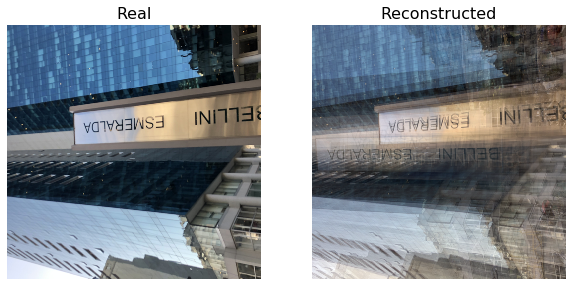

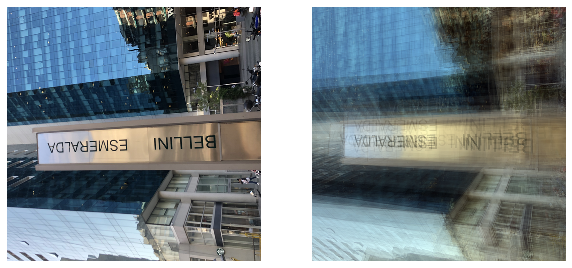

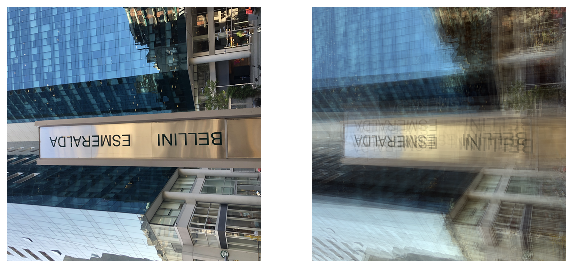

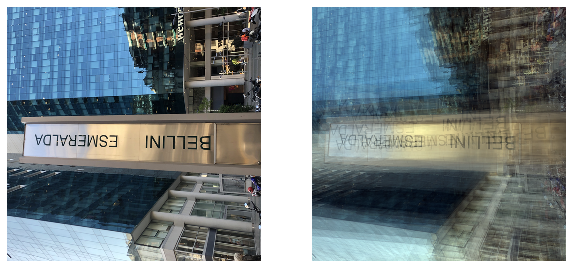

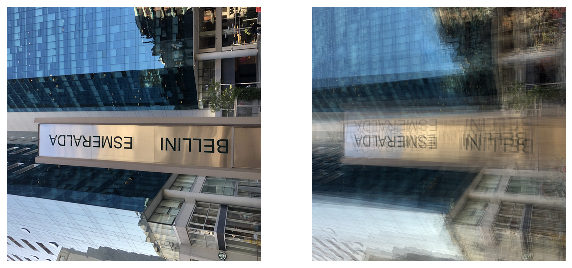

...

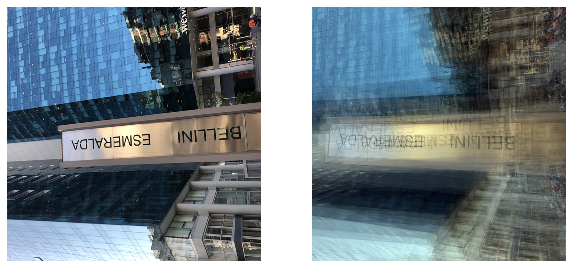

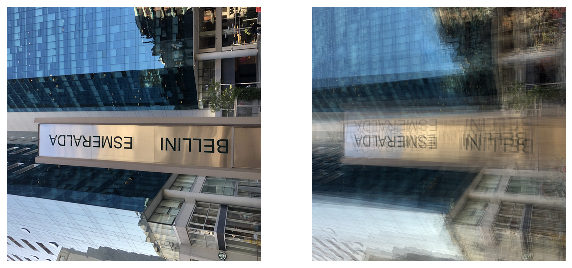

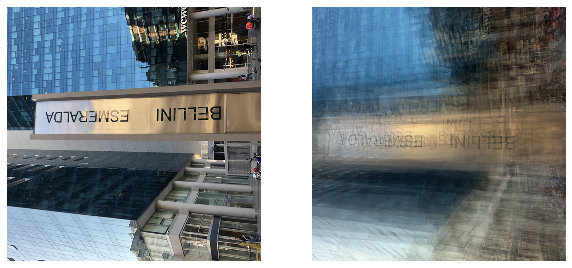

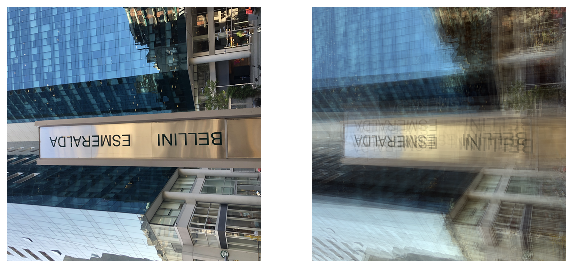

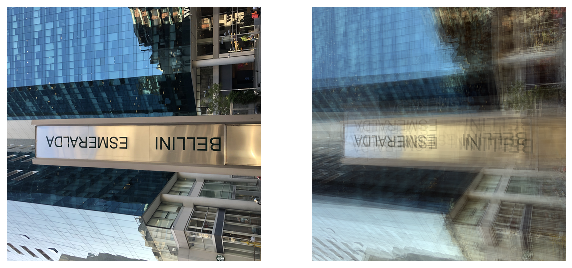

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


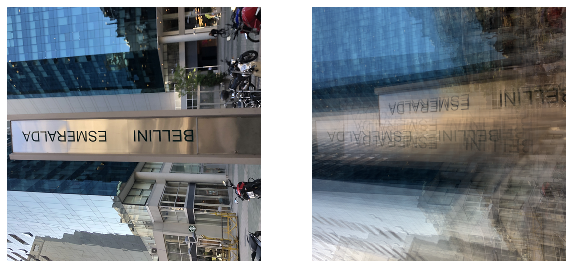

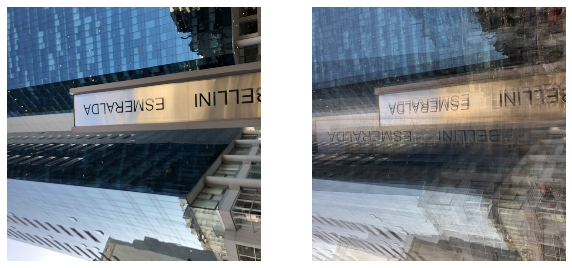

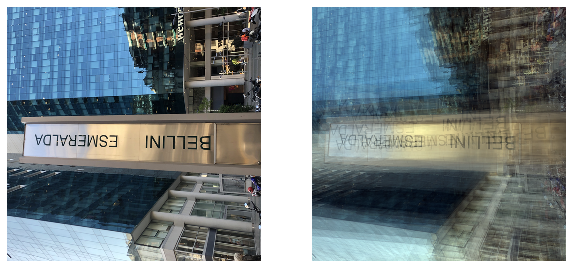

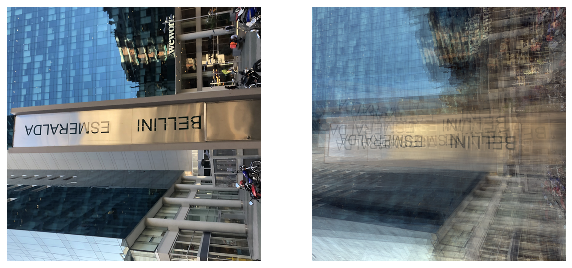

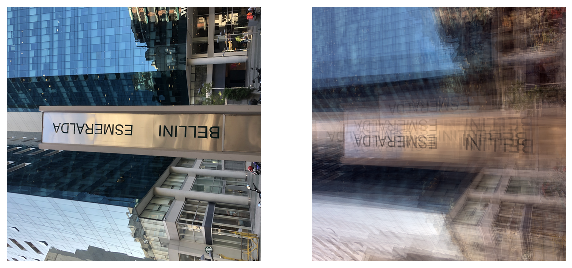

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


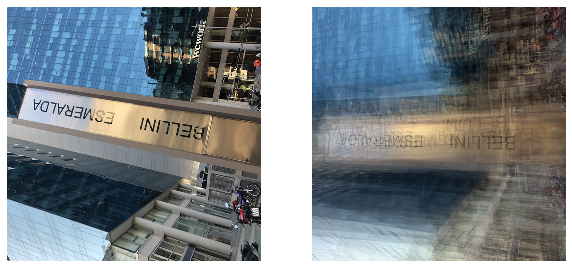

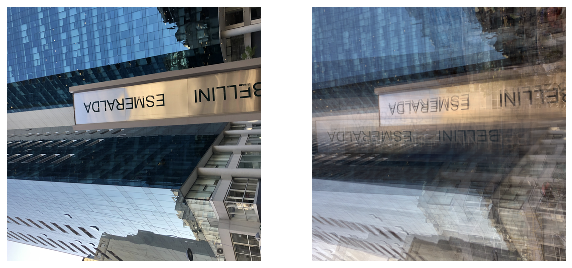

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


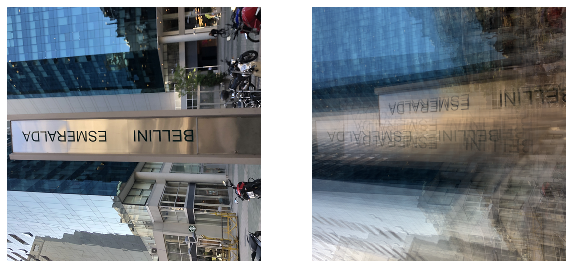

In [0]:
# plotting the original image and reconstructed images 
# side by side
for i in range(20):
    # defining figure size and axes for subplots
    fig, axes = plt.subplots(1,2, figsize = (10,5))
    # don't show the x- and y-axes
    axes[0].axis('off') 
    axes[1].axis('off')
    # add the original images and the reconstructed images to 
    # the subplot
    axes[0].imshow(images_flattened[i].reshape(512,512,3))
    axes[1].imshow(reconstructed_images[i].reshape(512,512,3))
    
    # add the labels only at the very top of the graph
    if i == 0:
        axes[0].set_title('Real', fontsize=16)
        axes[1].set_title('Reconstructed', fontsize=16)    
    plt.show()

## **Addding a far away point and reconstructing it**

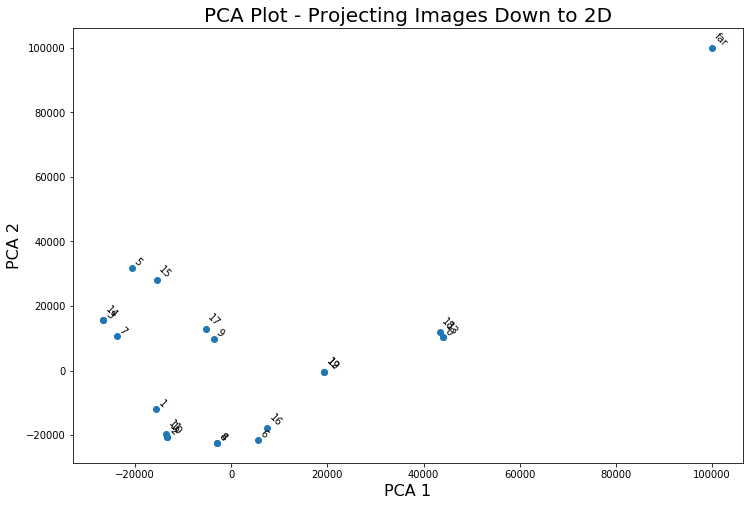

In [0]:
# adding an extra point that's really far away from all the data points
x_far = 100000
y_far = 100000
x.append(x_far)
y.append(y_far)

# plotting the results of the PCA into a scatterplot
plt.figure(figsize=(12,8))

plt.scatter(x,y)

# annotating the far away point
plt.annotate('far',xy=(x_far, y_far), clip_on=True, rotation=-45, 
                    horizontalalignment='left', verticalalignment='bottom',
                    size=10)

# annotating all the other points
for i in range(20):
    plt.annotate(str(label[i]),xy=(x[i], y[i]), clip_on=True, rotation=-45, 
                    horizontalalignment='left', verticalalignment='bottom',
                    size=10)
    
# adding the labels and plot titles and plotting the graph
plt.xlabel('PCA 1', size=16)
plt.ylabel('PCA 2', size=16)
plt.title('PCA Plot - Projecting Images Down to 2D', size=20)
plt.show()

In [0]:
# add the far point back into the data set
transformed_images_with_far = np.append(transformed_images, 
                                        [[x_far, y_far]], axis=0)

# transforming the images back from the 2D space to 512x512
images_transformed_with_far = pca.inverse_transform(transformed_images_with_far)

# reconstruct the images in 512x512 dimension
reconstructed_images_with_far = [convert_to_rgb(image, (512,512)) 
                                  for image in images_transformed_with_far]

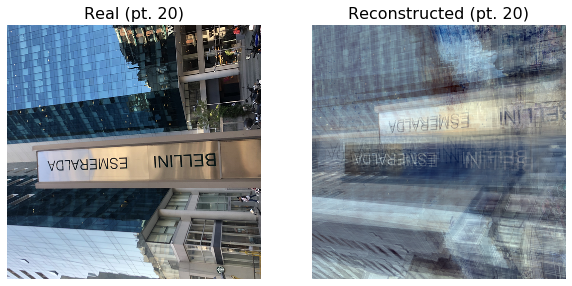

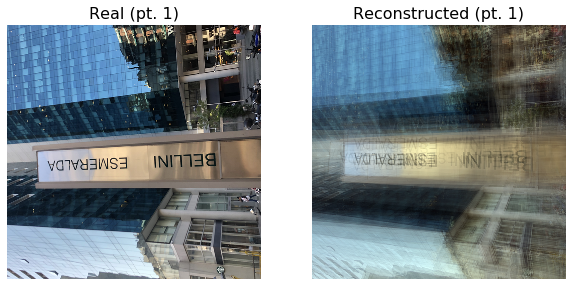

In [0]:
# here, we're picking point 20, since it's the very far away point 
# that we added to the data
# we will then compare it to point 1, a point that is in the center of the data

# plotting the original image and reconstructed images side by side
pts = [20, 1]
for i in pts:
    # defining figure size and axes for subplots
    fig, axes = plt.subplots(1,2, figsize = (10,5))
    # don't show the x- and y-axes
    axes[0].axis('off') 
    axes[1].axis('off')
    # add the original images and the reconstructed images to the subplot
    axes[0].imshow(images_flattened[1].reshape(512,512,3))
    axes[1].imshow(reconstructed_images_with_far[i].reshape(512,512,3))
    
    # add the labels
    axes[0].set_title(f'Real (pt. {i})', fontsize=16)
    axes[1].set_title(f'Reconstructed (pt. {i})', fontsize=16)    
    plt.show()

As you can see from the results above, the point that is very far away from the data (pt. 20, the point we added to the data set) gave us a rather blurry reconstructed image - as if you're looking at it with beer goggles, and the colors seem mismatched too - while the point located at the heart of the data (pt. 1) gave us a much clearer reconstructed image that is quite similar to the original image, just with a slight wobble.

In [0]:
!apt-get install texlive texlive-xetex texlive-latex-extra pandoc
!pip install pypandoc

Reading package lists... Done
Building dependency tree       
Reading state information... Done
pandoc is already the newest version (1.19.2.4~dfsg-1build4).
pandoc set to manually installed.
The following package was automatically installed and is no longer required:
  libnvidia-common-430
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  fonts-droid-fallback fonts-lato fonts-lmodern fonts-noto-mono fonts-texgyre
  libcupsfilters1 libcupsimage2 libgs9 libgs9-common libijs-0.35 libjbig2dec0
  libkpathsea6 libpotrace0 libptexenc1 libruby2.5 libsynctex1 libtexlua52
  libtexluajit2 libzzip-0-13 lmodern poppler-data preview-latex-style rake
  ruby ruby-did-you-mean ruby-minitest ruby-net-telnet ruby-power-assert
  ruby-test-unit ruby2.5 rubygems-integration t1utils tex-common tex-gyre
  texlive-base texlive-binaries texlive-fonts-recommended texlive-latex-base
  texlive-latex-recommended texlive-pictures texlive-plain-generic tipa
Suggested packages:

In [0]:
from google.colab import files
files.upload()

Saving CS156 LBA.ipynb to CS156 LBA.ipynb


{'CS156 LBA.ipynb': b'{\n  "nbformat": 4,\n  "nbformat_minor": 0,\n  "metadata": {\n    "colab": {\n      "name": "CS156 LBA - ML.ipynb",\n      "provenance": []\n    },\n    "kernelspec": {\n      "name": "python3",\n      "display_name": "Python 3"\n    }\n  },\n  "cells": [\n    {\n      "cell_type": "markdown",\n      "metadata": {\n        "id": "w8Q_h3AdMR6a",\n        "colab_type": "text"\n      },\n      "source": [\n        "## **Importing all necessary libraries**"\n      ]\n    },\n    {\n      "cell_type": "code",\n      "metadata": {\n        "id": "7fFkmD5Ietex",\n        "colab_type": "code",\n        "colab": {\n          "base_uri": "https://localhost:8080/",\n          "height": 141\n        },\n        "outputId": "7ee3119a-c5b3-419e-87fc-e28bdb2b7342"\n      },\n      "source": [\n        "!pip install python-resize-image"\n      ],\n      "execution_count": 2,\n      "outputs": [\n        {\n          "output_type": "stream",\n          "text": [\n            "Requ

In [0]:
!jupyter nbconvert --to PDF "CS156 LBA.ipynb"

[NbConvertApp] Converting notebook CS156 LBA.ipynb to PDF
[NbConvertApp] Support files will be in CS156 LBA_files/
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./CS156 LBA_files
[NbConvertApp] Making directory ./C

In [0]:
!jupyter nbconvert --to latex "CS156 LBA.ipynb"

[NbConvertApp] Converting notebook CS156 LBA.ipynb to latex
[NbConvertApp] Support files will be in CS156 LBA_files/
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Making directory CS156 LBA_files
[NbConvertApp] Maki